# Neural Networks - MTH 4320 
# Project I

## Instructor: Dr. Ryan White
## Student: Giulio Martini

# Title: Churn classification using Feed Forward Neural Networks

### Description

    'Churn' is a term associated in business with the number of people, or employees, that decide to terminate their association with the company, in a given period of time. Churn modelling and prediction has proven to be very useful and insightful for countless companies across the globe: if they can predict who decides to leave in a given time period, they can adjust their business strategy and model to retain as many customers and employees. 

    The dataset provided is a list of 10 000 customers from Europe, specifically France, Germany and Spain. The dataset has 14 columns, the last of which is called 'Exited'. It is a binary feature, composed only of 0s and 1s, and illustrates whether the particular client has left the company or not.

    The goal of this study is to find the best hyperparameters for a Feed Forward Neural Network to correctly predict the exit of a client; the results will then be compared to a standard Random Forest classifier, aided by an XGBoost, in order to compare them and see if machine learning algorithm have a better starting advantage than Neural Networks. 

    Other features are either categorical or numerical. The most influential will be paid the most attention,  and their correlation status will be observed through a correlation matrix. 

    The study will open with plots and graphs, in order to fully understand the dataset, and will then move on to data preprocessing; the random forest and XGBoost benchmark will be performed, and will subsequently be followed by an ever improving Feed Forward Neural Network.


In [87]:
# Libraries used
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.express as px
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
import scipy.stats as stats
from tensorflow.keras.layers import Dense
from tensorflow.keras import Sequential
from sklearn.metrics import confusion_matrix
from tensorflow.keras import optimizers
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from pyparsing import line
from tensorflow.keras.regularizers import l1_l2
from tensorflow.keras.layers import Dropout
from tensorflow.keras.initializers import RandomUniform
from tensorflow.keras.initializers import GlorotUniform
from tensorflow.keras.initializers import GlorotNormal
from tensorflow.keras.initializers import HeUniform
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.initializers import HeNormal





In [5]:
#  The database is loaded inside a pandas dataframe called 'customers'
customers = pd.read_csv(r'C:\Users\marti\OneDrive\Desktop\NeuralNetworksProject1\customers.csv')
customers.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


## Data analysis

    Before delving deep into the Neural Network architecture creation, sufficient time MUST be spent analysing the data, its main featues and the features that should have the most attention to paid. 

<AxesSubplot:>

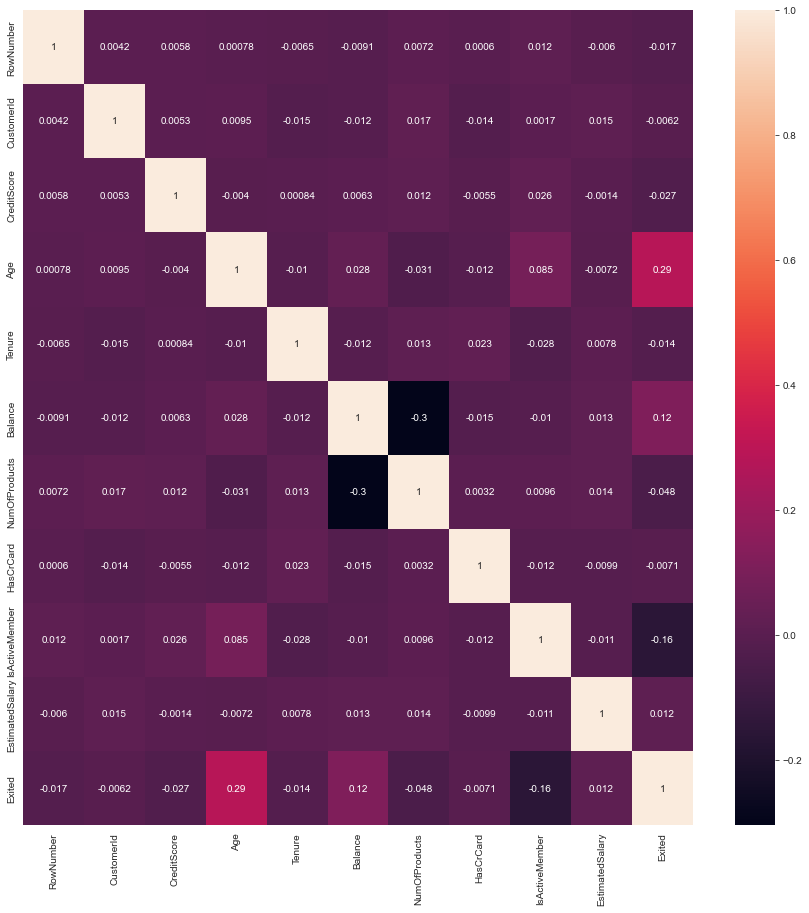

In [45]:
plt.figure(figsize=(15,15))
sb.heatmap(customers.corr(), changed_modelot=True) # A heatmap is drawn from the different correlations of all the features in the database.
# The values range from -1 to 1; the higher the number, the stronger the correlation. 

<AxesSubplot:>

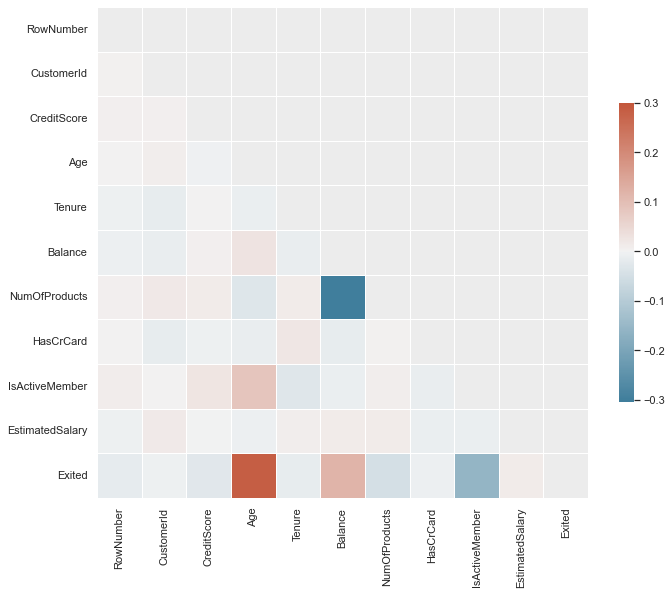

In [78]:
corr = customers.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
figure, axis = plt.subplots(figsize=(11, 11))
corrMap = sb.diverging_palette(230, 20, as_cmap=True)
sb.heatmap(corr, mask=mask, cmap=corrMap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})

### Heatmaps -- Results

    Heatmaps are a marvelous tool to visualize how different features are correlated to each other. The values range from -1 to 1; the higher the number, the stronger the correlation, along with differences in color. The second heatmap is derived in order to view specifically the close range at which correlations run, which is -0.3 to 0.3.

    The defining row (or column) to pay attention to, as stated previously, is 'Exited', and it can be seen that the strongest correlations are brought forth by: 

* Age
* Balance
* Estimated Salary

    These results are marvelous, as they are all numeric, none being divergent in essential type (numerical or classifying). 
    Further analysis will be performed on these three features, along with the others of course.

In [94]:
def distributionMeasures(df, feature, title, symb):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(8,5),gridspec_kw={"height_ratios": (.2, .8)})
    ax[0].set_title(title,fontsize=18)
    sb.boxplot(x=feature, data=df, ax=ax[0])
    ax[0].set(yticks=[])
    sb.histplot(x=feature, data=df, ax=ax[1])
    ax[1].set_xlabel(feature, fontsize=16)
    plt.axvline(df[feature].mean(), color='green', linewidth=2.2, label='Mean =' + str(np.round(df[feature].mean(),1)) + symb)
    plt.axvline(df[feature].median(), color='red', linewidth=2.2, label='Median ='+ str(np.round(df[feature].median(),1)) + symb)
    plt.axvline(df[feature].mode()[0], color='purple', linewidth=2.2, label='Mode ='+ str(np.round(df[feature].mode()[0],1)) + symb)
    plt.legend(bbox_to_anchor=(1, 1.03), ncol=1, fontsize=17, fancybox=True, shadow=True, frameon=True)
    plt.tight_layout()
    plt.show()

In [115]:
def createPlots(feature , database): # Function used three different violin plots, for the purpose of furthering data analysis.
    violinPlot = px.violin(database, y= feature)
    violinPlot.show()
    violinPlot = px.violin(database, x="Geography", y=feature, orientation= 'v')
    violinPlot.show()
    violinPlot = px.violin(database, x="Gender", y=feature, orientation= 'v')
    violinPlot.show()
    distributionMeasures(customers, feature, 'Distribution' , '$' )

    



### Age Analysis

    The various plot found below are meant to show that throughout the company, the Age is around 38 years old, with the median being 37. In addition, the mean and general distribution is homogenous among sexes AND among different parts of the continent where the company is settled in. 

    The analysis further displayes a 'Danger Region', between 49 and 59, where more clients leave than stay. A good characteristic to keep in mind.

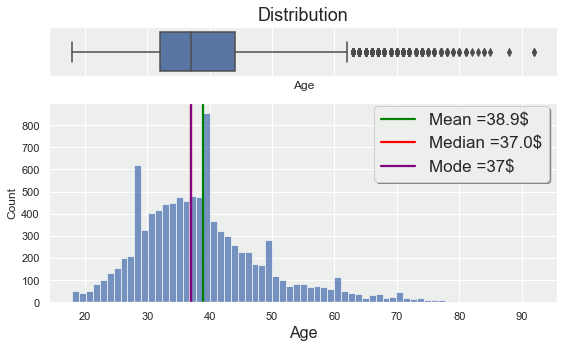

In [116]:
createPlots('Age' , customers)

In [50]:
fig = px.violin(customers, x="Geography", y="Age", orientation= 'v')
fig.show()

In [51]:
fig = px.box(customers, x="Age", y="Geography", notched=True)
fig.show()

Text(0.5, 0, 'Age Group')

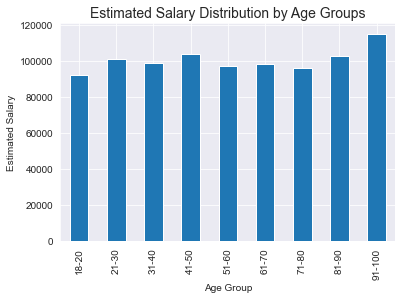

In [52]:
age_labels = ['18-20', '21-30', '31-40', '41-50', '51-60', '61-70', '71-80', '81-90', '91-100']
Age_group = pd.cut(customers['Age'], range(10, 101, 10), right=False, labels=age_labels)
customers.groupby(Age_group)['EstimatedSalary'].mean().plot(kind='bar',stacked=True)
plt.title("Estimated Salary Distribution by Age Groups",fontsize=14)
plt.ylabel('Estimated Salary')
plt.xlabel('Age Group')

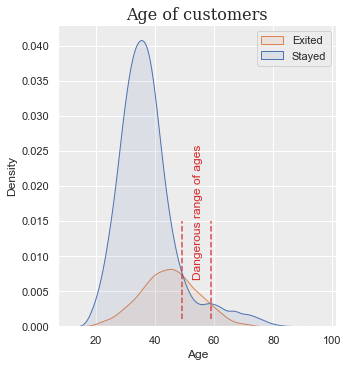

In [80]:
font_to_be_used = {'family':'serif' , 'size':16}
sb.displot(data = customers , x = 'Age' , hue = 'Exited' , fill = True , kind = 'kde' , legend = False , alpha = 0.1)
plt.legend(labels = ['Exited' , 'Stayed'])
plt.plot([49 , 49] , [0.001,0.015] , linestyle = '--' , c = 'tab:red' , alpha = 0.8)
plt.plot([59 , 59] , [0.001,0.015] , linestyle = '--' , c = 'tab:red' , alpha = 0.8)
plt.title('Age of customers' , fontdict = font_to_be_used)
plt.text(53 , 0.007 ,'Dangerous range of ages' , rotation = 90 , color ='tab:red')
plt.show()

### Estimated Salary Analysis

    Analysis regarding the Estimated Salary shows that it follows the same trend as Age: steady mean for both Genders and Geography. The variance is incredibly low between the values, they are uniformally distributed. A mean of 100 000.9$

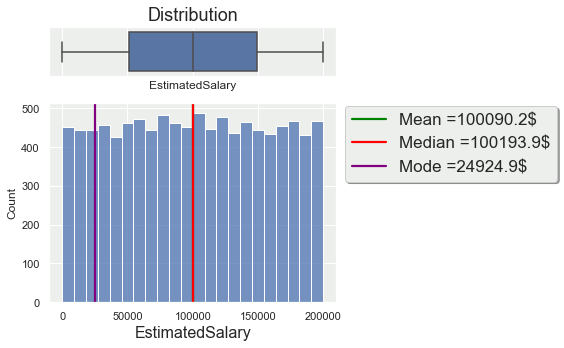

In [117]:
createPlots('EstimatedSalary' , customers)

Text(32.142968749999994, 0.5, 'Estimated Salary')

<Figure size 1440x1440 with 0 Axes>

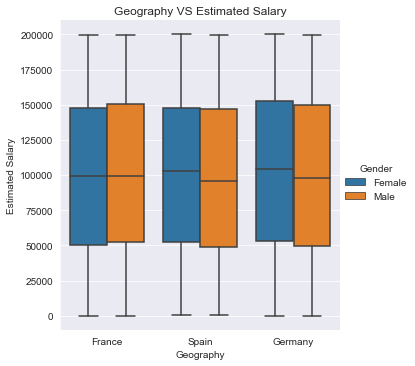

In [55]:
plt.figure(figsize=(20,20))
sb.catplot(x="Geography", y="EstimatedSalary", hue="Gender", kind="box", data=customers)
plt.title("Geography VS Estimated Salary")
plt.xlabel("Geography")
plt.ylabel("Estimated Salary")

C:\Users\marti\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



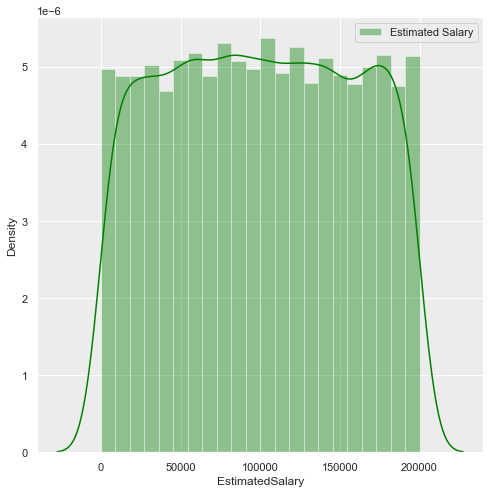

In [42]:
fig = plt.figure(figsize=(8,8))
sb.distplot(customers.EstimatedSalary, color="green", label="Estimated Salary")
plt.legend()

### Balance Analysis
    
    Balance appears to be a diverging feature, when compared to the previous two. There seems to be a number of people, both male and female, which have either a zero balance or a negative balance. This may be attributed to the fact that either some cllients did not wish to disclose that information. In any case, they will be accounted for, just because of the fact that some customers may really have zero balances. It possesses a mean of 76 485.9$

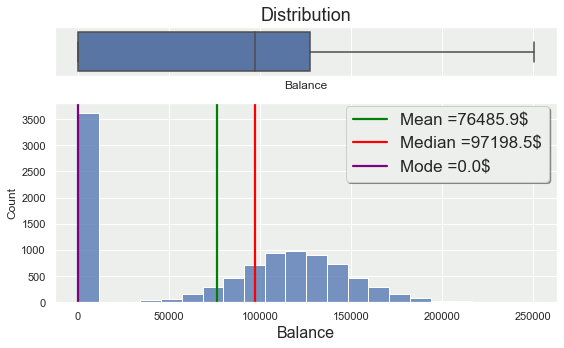

In [118]:
createPlots('Balance' , customers)

Text(32.11888020833334, 0.5, 'Balance')

<Figure size 1440x1440 with 0 Axes>

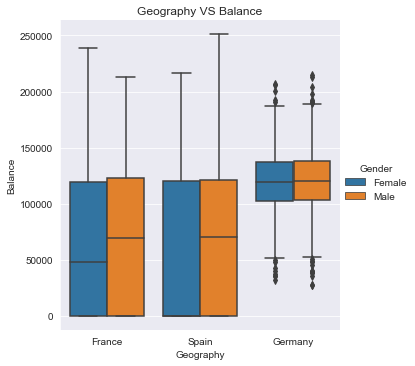

In [58]:
plt.figure(figsize=(20,20))
sb.catplot(x="Geography", y="Balance", hue="Gender", kind="box", data=customers)
plt.title("Geography VS Balance")
plt.xlabel("Geography")
plt.ylabel("Balance")

C:\Users\marti\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



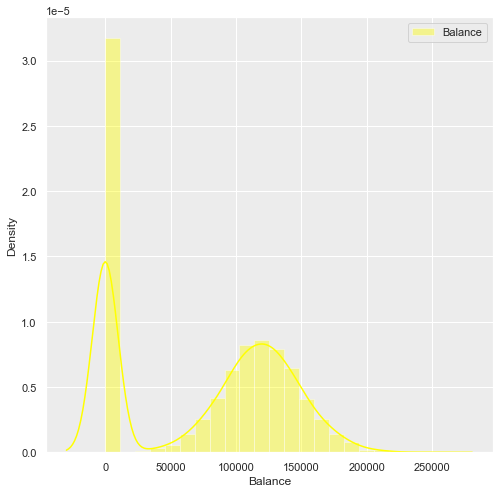

In [99]:
figure = plt.figure(figsize=(8,8))
sb.distplot(customers.Balance, color="yellow", label="Balance")
plt.legend()

### Further visualizations

    Further visualizations, analizing more than one feature at a time, are meant to display that the most influential features are not linearly correlated to a great extent, as demonstrated by a line of slope close to 0 and wide confidence intervals. It must be noted, however, that the majority of clients are around the age of 36, and have a Credit Score of 650. That was attested already by the previous graphs. 

(-0.001384292867984518, 0.8899147753848302)


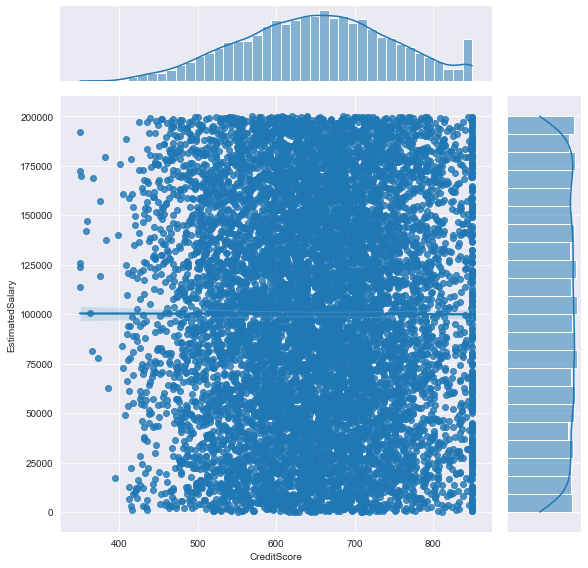

C:\Users\marti\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



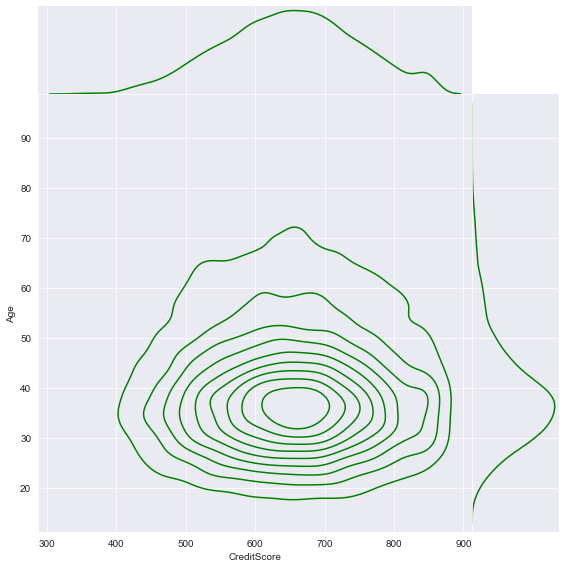

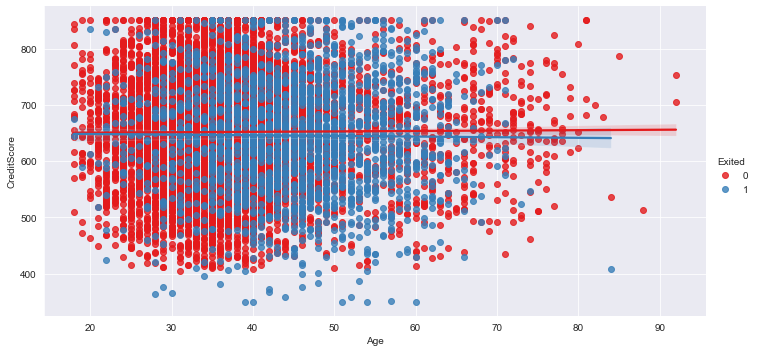

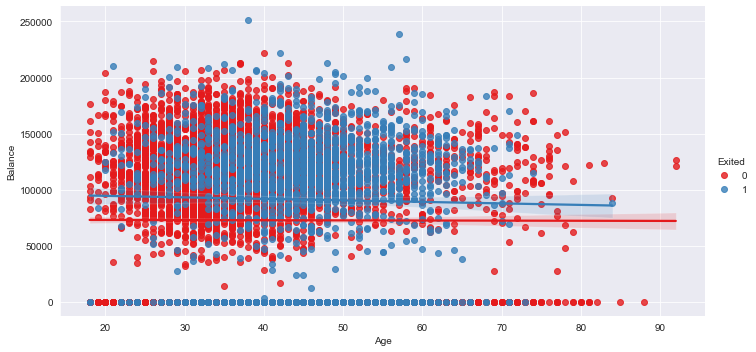

In [60]:
line1 = sb.jointplot(x="CreditScore",y="EstimatedSalary", data=customers, kind="reg", height=8)
print(stats.pearsonr(customers['CreditScore'], customers['EstimatedSalary']))
plt.show()
#The second jointplot is the same as the first, albeit with a different plotting scheme. Som readers may enjoy more this format, hence the reason
#for why it was added.
sb.jointplot("CreditScore","Age", data=customers, kind="kde", space=0, color="g",  height=8)

plt.show()
#More linear regression plots are graphed, equipped with a line for better understanding.
sb.lmplot(x="Age",y="CreditScore", hue="Exited", data=customers, palette="Set1", aspect=2)
plt.show()

sb.lmplot(x="Age",y="Balance", hue="Exited", data=customers, palette="Set1", aspect=2)
plt.show()

### Parallel categories

    The parallel categories graphs aid in visualizing how the different categorical features are connected. Like many of the graphs presented in the analysis, they are interactive. 

In [102]:
fig = px.parallel_categories(customers)
fig.show()

fig = px.parallel_categories(customers, dimensions=['HasCrCard', 'IsActiveMember'],
                 color_continuous_scale=px.colors.sequential.Inferno,
                labels={'HasCrCard':'Credit Card Holder', 'IsActiveMember':'Activity Status'})
fig.show()
fig = px.parallel_categories(customers, dimensions=['HasCrCard', 'Gender','IsActiveMember'],
                 color_continuous_scale=px.colors.sequential.Inferno,
                labels={'Gender':'Gender', 'HasCrCard':'Credit Card Holder', 'IsActiveMember':'Activity Status'})
fig.show()
fig = px.parallel_categories(customers, dimensions=['IsActiveMember', 'Exited',],
                 color_continuous_scale=px.colors.sequential.Inferno,
                labels={'IsActiveMember':'Activity Status', 'Exited':'Exited Members',})
fig.show()

### Analysis on the customers that decided to leave 

    The results show that more than a fifth of the company customers left, with a slight majority being female. Spain has bettern churn values than France and Germany, which are tied.

Exited
Geography Exited        
France    0         4204
          1          810
Germany   0         1695
          1          814
Spain     0         2064
          1          413

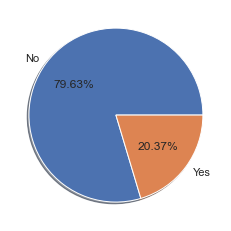

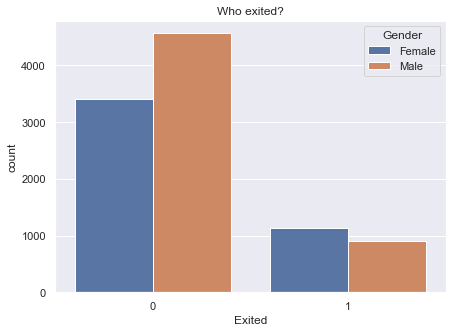

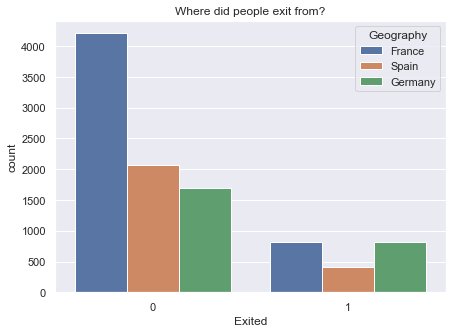

In [104]:
plt.pie(customers['Exited'].value_counts(), labels = ['No', 'Yes'], shadow = True, autopct = '%1.2f%%')
plt.figure(figsize =(7,5))
sb.set_style('darkgrid')
sb.countplot(x = 'Exited', hue = 'Gender', data = customers)
plt.title('Who exited?')
pd.DataFrame(customers.groupby(['Gender', 'Exited'])['Exited'].count())
plt.figure(figsize =(7,5))
sb.set_style('darkgrid')
sb.countplot(x = 'Exited', hue = 'Geography', data = customers)
plt.title('Where did people exit from?')
pd.DataFrame(customers.groupby(['Geography', 'Exited'])['Exited'].count())

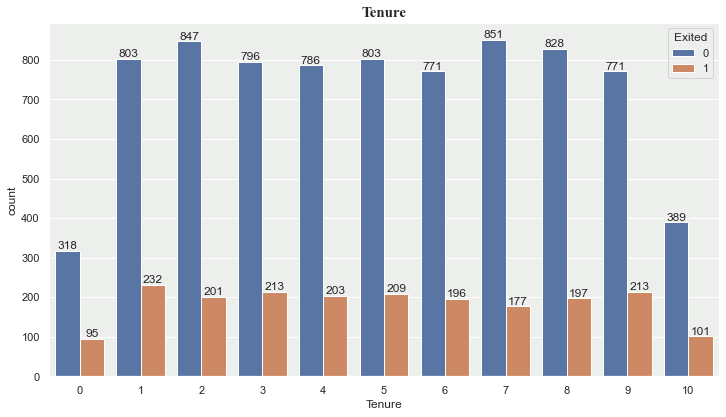

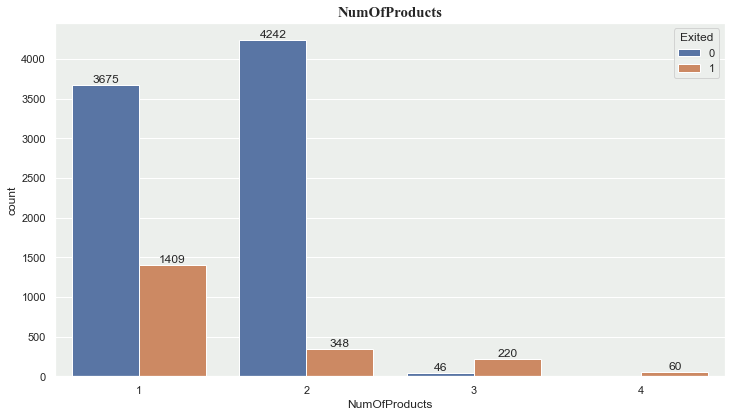

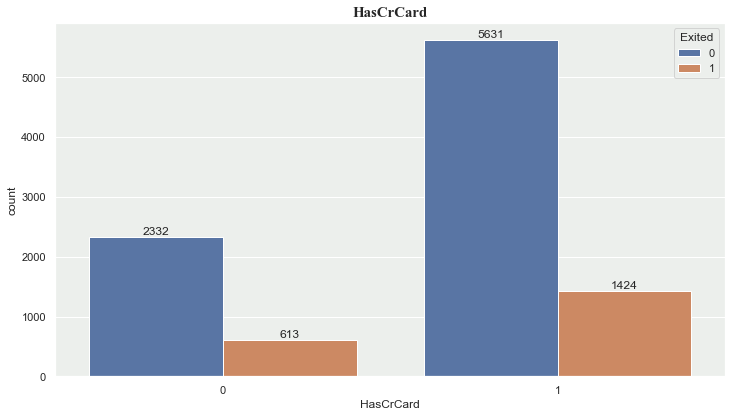

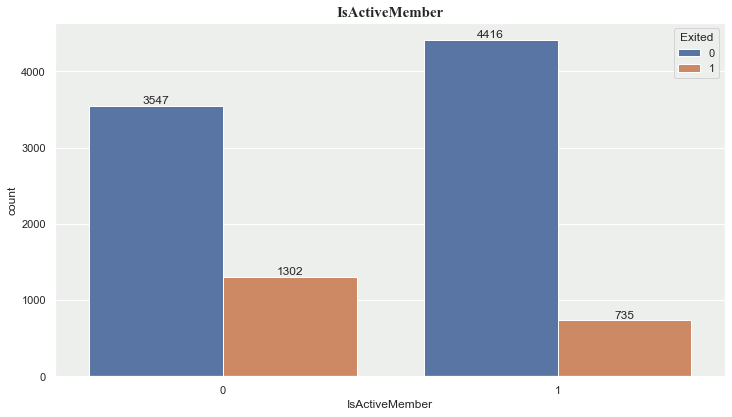

In [107]:
categoricals = customers[['Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember']]  
sb.set(rc={'axes.facecolor':'#ECEFEC'}) 

for feature in categoricals:
    plt.figure(figsize=(12,6.5)) 
    plt.title(feature, fontsize=15, fontweight='bold', fontname='Times new roman', ha='center')
    ax = sb.countplot(x = categoricals[feature], hue = 'Exited', data = customers)
    for container in ax.containers:
        ax.bar_label(container)
    plt.show()

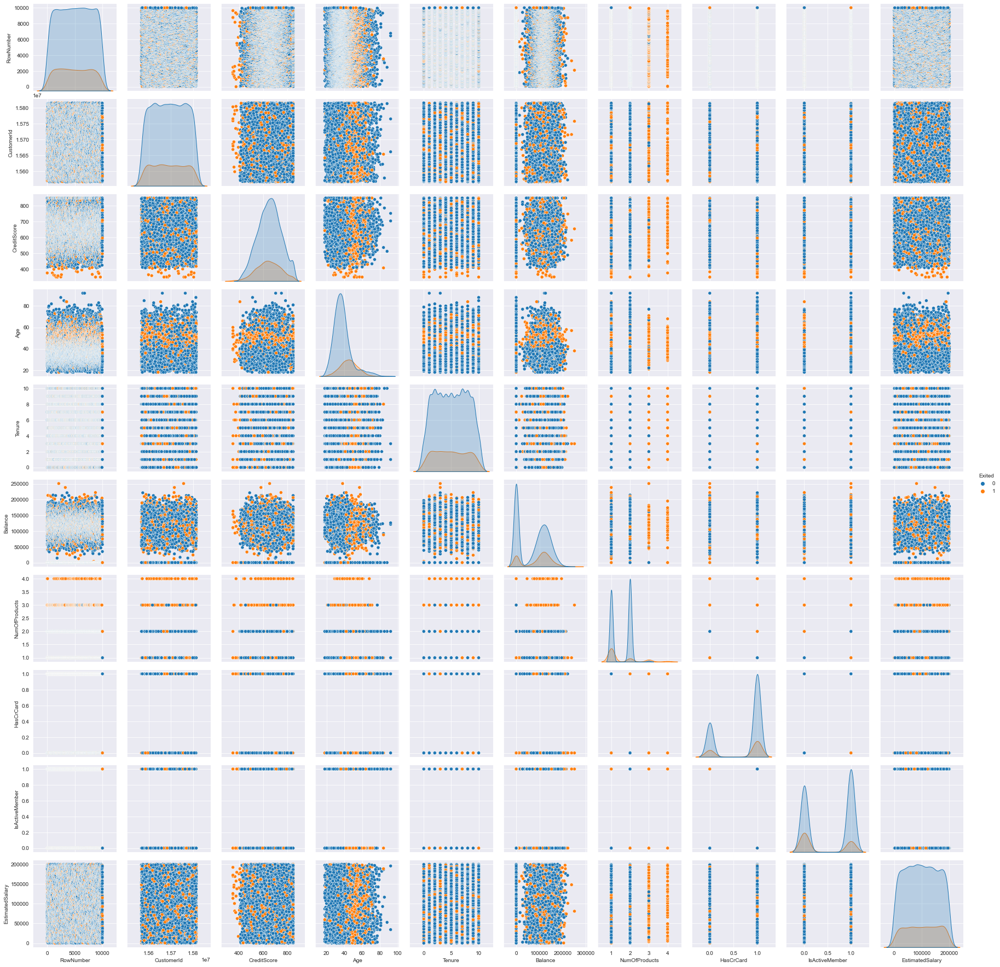

In [63]:
sb.pairplot(customers,hue='Exited')


In [14]:
np.round(customers.describe(),2)

,RowNumber,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.0
mean,5000.50,15690940.57,650.53,38.92,5.01,76485.89,1.53,0.71,0.52,100090.24,0.2
std,2886.90,71936.19,96.65,10.49,2.89,62397.41,0.58,0.46,0.50,57510.49,0.4
min,1.00,15565701.00,350.00,18.00,0.00,0.00,1.00,0.00,0.00,11.58,0.0
25%,2500.75,15628528.25,584.00,32.00,3.00,0.00,1.00,0.00,0.00,51002.11,0.0
50%,5000.50,15690738.00,652.00,37.00,5.00,97198.54,1.00,1.00,1.00,100193.92,0.0
75%,7500.25,15753233.75,718.00,44.00,7.00,127644.24,2.00,1.00,1.00,149388.25,0.0
max,10000.00,15815690.00,850.00,92.00,10.00,250898.09,4.00,1.00,1.00,199992.48,1.0


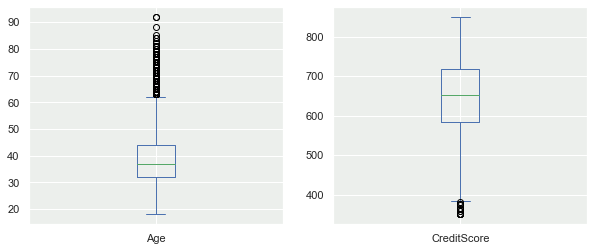

(-4.0, 80.0)

In [109]:
fig = plt.figure(figsize=(10,4))
ax = fig.add_subplot()
plt.subplot(1,2,1)
customers['Age'].plot(kind='box')
plt.subplot(1,2,2)
customers['CreditScore'].plot(kind='box')
plt.show()

def skewedBoundries(dataset, variance, distance):
    IQR = dataset[variance].quantile(0.75) - dataset[variance].quantile(0.25)
    lowerBoundry = dataset[variance].quantile(0.25) - (IQR * distance)
    upperBoundry = dataset[variance].quantile(0.75) + (IQR * distance)
    
    return lowerBoundry, upperBoundry
ageLowerBoundry, ageUpperBoundry = skewedBoundries(customers, 'Age', 3)
ageLowerBoundry, ageUpperBoundry

## Data interpretation from analysis

   The results are varied among all the different classes, specifically the ones most correlated with whether people exited the company or not. We can start by saying that this dataset is composed primarily of men, as they are 80% of the set, while women are the remaining 20%. Most of these people come from France, while a minority come from Spain and Germany. About 20% of them left the company, with more men leaving then women. The customers, on average, are 38 years old and have a 6 figure salary (100 000 euros). Some of them do not have a zero balance. These customers could be students, or simply people who did not wish to disclose this information. Their number is too great to remove them, and to make matters more challenging they must be taken into account. In addition, some of these protagonists may very well actually have zero balances. In any case, the mean of the balances is found to be around 76 000 euros. 

  
   + The average client: Male, 38 years old with a six figure salary and 76K euros in the bank. 
    
    

## DATA PREPROCESSING 

        For the model to be correctly trained, the data MUST be processed. The processing will include the elimination of superflous features, a correct normalization (placing all the values of each datapoint between 0 and 1), and correctly splitting the data.
        The data shall be split between training (60%), validation (20%) and testing (20%). The training set will tune the parameters, the validation split will tune the hyperparameters and the testing split will be used to test the model only once.

In [110]:
print('Total users {}'.format(len(customers)))
print()
print('Users having Age more than 62: {}'.format(len(customers[customers['Age'] > ageUpperBoundry])))
print('% Users having Age more than 62: {}'.format(len(customers[customers['Age'] > ageUpperBoundry])/len(customers)))

Total users 10000

Users having Age more than 62: 12
% Users having Age more than 62: 0.0012


In [112]:
creditScoreLowerBoundry, creditScoreUpperBoundry = skewedBoundries(customers, 'CreditScore', 1.5)
creditScoreLowerBoundry, creditScoreUpperBoundry

(383.0, 919.0)

In [113]:

print('Total users {}'.format(len(customers)))
print()
print('Users having credit score less than 380: {}'.format(len(customers[customers['CreditScore'] < creditScoreLowerBoundry])))
print('% Users having credit score less than 380: {}'.format(len(customers[customers['CreditScore'] < creditScoreLowerBoundry])/len(customers)))
print()
print('Users having credit score more than 920: {}'.format(len(customers[customers['CreditScore'] > creditScoreUpperBoundry])))
print('% Users having credit score more than 920: {}'.format(len(customers[customers['CreditScore'] > creditScoreUpperBoundry])/len(customers)))

Total users 10000

Users having credit score less than 380: 15
% Users having credit score less than 380: 0.0015

Users having credit score more than 920: 0
% Users having credit score more than 920: 0.0


In [10]:
gender = pd.get_dummies(customers["Gender"], drop_first=True)
geography = pd.get_dummies(customers['Geography'], drop_first=True)
geography = geography.astype(int)
gender = gender.astype(int)
customerUpdated = pd.concat([customers, gender, geography], axis=1)
columnsCategorical = ['IsActiveMember', 'EstimatedSalary', 'Tenure', 'Balance', 'CreditScore', 'Age', 'NumOfProducts', 'HasCrCard', 'Male', 'Germany', 'Spain']

X = customerUpdated[columnsCategorical]
Y = customerUpdated['Exited']

trainValX, testX, trainValY, testY = train_test_split(X, Y, test_size=0.2, random_state=2)
trainX, valX, trainY, valY = train_test_split(trainValX, trainValY, test_size = 0.25, random_state = 2)


In [11]:

scaler = StandardScaler()
trainX = scaler.fit_transform(trainX)
valX = scaler.fit_transform(valX)
testX = scaler.fit_transform(testX)

## Benchmarking

    Random forest with XG Boost will be used for benchmarking. The intended goal of this study is to see how a Feed Forward Neural Network performs against the best classification algorithm in machine learning.

In [114]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn import metrics

randomForest = RandomForestClassifier(random_state = 1 , max_depth = 15 , n_estimators = 1000)
randomForest.fit(trainX , trainY)

randomForestPredictionTest = randomForest.predict(testX)
randomForestPredictionTrain = randomForest.predict(trainX)

randomForestAccuracy = metrics.accuracy_score(testY , randomForestPredictionTest)
randomForestPredictions = metrics.precision_score(testY , randomForestPredictionTest , average = None)[0]
randomForestAccuracyTrain = metrics.accuracy_score(trainY , randomForestPredictionTrain)
print("-Test-")
print("Accuracy =" , randomForestAccuracy)
print("Precision =" , randomForestPredictions)
print("-Train-")
print("Random forest accuracy on train set =",randomForestAccuracyTrain)

-Test-
Accuracy = 0.859
Precision = 0.8794769755542922
-Train-
Random forest accuracy on train set = 0.988


In [19]:
xgboost = XGBClassifier(subsample = 0.9 , random_state = 1 , n_estimators = 1200 , max_depth = 15 , use_label_encoder = False
                   , learning_rate = 0.01 , gamma = 0.1)
xgboost.fit(trainX , trainY)
predXGB = xgboost.predict(testX)
accXGB = metrics.accuracy_score(testY , predXGB) 
predXGB = metrics.precision_score(testY , predXGB , average = None)[0]
print("XGBoost classifier accuracy =" , accXGB)
print("XGBoost classifier precision =" , predXGB)

[02:33:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost classifier accuracy = 0.8505
XGBoost classifier precision = 0.8818076477404403


## Benchmark results

    The Random Forest accuracy is close to 86%, while the XGBoost is a little over 85%. Really good results on their behalf. Hopefully, the Neural Networks can come close, if not beat them. 

## Base Model

    The creation of the perfect Neural Network begins with a base model, composed of 4 layers, with two hidden layers, one made of 32 neurons, the other 16. The input layer is composed of 11 neurons, while the output layer only has 1. 

In [20]:
# Initialising the changed_model
classifier = Sequential()
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 32, activation='relu',input_dim = 11))
# Adding the second hidden layer
classifier.add(Dense(units = 16, activation='relu'))
# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid'))
# Compiling the changed_model
classifier.compile(loss = 'categorical_crossentropy', metrics = ['accuracy'])
# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 2s 19ms/step - loss: 0.0000e+00 - accuracy: 0.7743 - val_loss: 0.0000e+00 - val_accuracy: 0.8090
Epoch 2/100
47/47 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.7880 - val_loss: 0.0000e+00 - val_accuracy: 0.8090
Epoch 3/100
47/47 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.7880 - val_loss: 0.0000e+00 - val_accuracy: 0.8090
Epoch 4/100
47/47 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.7880 - val_loss: 0.0000e+00 - val_accuracy: 0.8090
Epoch 5/100
47/47 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - accuracy: 0.7880 - val_loss: 0.0000e+00 - val_accuracy: 0.8090
Epoch 6/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - accuracy: 0.7880 - val_loss: 0.0000e+00 - val_accuracy: 0.8090
Epoch 7/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - accuracy: 0.7880 - 

In [21]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

200/200 [==============================] - 1s 3ms/step - loss: 0.0000e+00 - accuracy: 0.8085
              precision    recall  f1-score   support

           0       0.81      1.00      0.89      1617
           1       0.00      0.00      0.00       383

    accuracy                           0.81      2000
   macro avg       0.40      0.50      0.45      2000
weighted avg       0.65      0.81      0.72      2000



C:\Users\marti\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\marti\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\marti\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_classification.py:1318

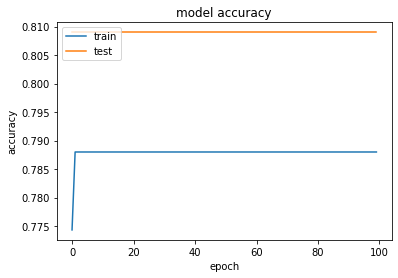

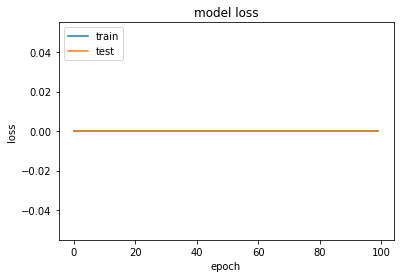

In [22]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]]
7878    1
3224    1
1919    1
4432    0
4835    0
       ..
9073    1
8584    0
5390    1
5092    1
2964    0
Name: Exited, Length: 2000, dtype: int64


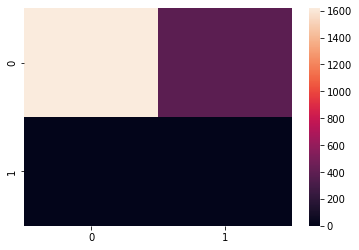

In [23]:
#Get the confusion matrix
cf_matrix = confusion_matrix(predY, testY)
temp = [predY, testY]
heat_map = sb.heatmap(cf_matrix)
print(predY)
print(testY)

plt.show()

## Base Model Results

    The model ends 100 epochs with an accuracy score of 0.81, or 81%. Really close to the intended result; however, it clearly shows that  neither the accuracy nor the loss have improved. Something FUNDAMENTAL about the network must be changed. 
### Next step

    Since the loss has not moved at all, that is the first feature that shall be changed.  

In [24]:
# Initialising the changed_model
classifier = Sequential()
opt = keras.optimizers.Adam(learning_rate = 0.0005)
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 32, activation='relu',input_dim = 11))

# Adding the second hidden layer
classifier.add(Dense(units = 16, activation='relu'))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid'))

# Compiling the changed_model
classifier.compile(optimizer = opt, loss = 'mean_squared_error', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 10ms/step - loss: 0.1888 - accuracy: 0.7598 - val_loss: 0.1646 - val_accuracy: 0.8025
Epoch 2/100
47/47 [==============================] - 0s 4ms/step - loss: 0.1641 - accuracy: 0.7868 - val_loss: 0.1479 - val_accuracy: 0.8080
Epoch 3/100
47/47 [==============================] - 0s 4ms/step - loss: 0.1527 - accuracy: 0.7887 - val_loss: 0.1400 - val_accuracy: 0.8100
Epoch 4/100
47/47 [==============================] - 0s 4ms/step - loss: 0.1460 - accuracy: 0.7933 - val_loss: 0.1356 - val_accuracy: 0.8145
Epoch 5/100
47/47 [==============================] - 0s 5ms/step - loss: 0.1416 - accuracy: 0.7958 - val_loss: 0.1321 - val_accuracy: 0.8190
Epoch 6/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1376 - accuracy: 0.8060 - val_loss: 0.1290 - val_accuracy: 0.8275
Epoch 7/100
47/47 [==============================] - 0s 4ms/step - loss: 0.1343 - accuracy: 0.8117 - val_loss: 0.1266 - val_accuracy: 0.8290
Epoch 8/100


In [25]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

200/200 [==============================] - 0s 2ms/step - loss: 0.1103 - accuracy: 0.8525
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      1617
           1       0.65      0.49      0.56       383

    accuracy                           0.85      2000
   macro avg       0.77      0.71      0.74      2000
weighted avg       0.84      0.85      0.84      2000



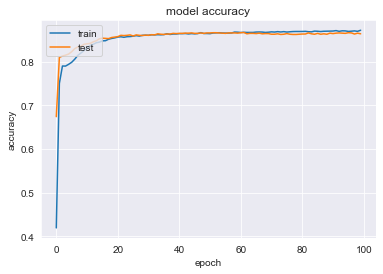

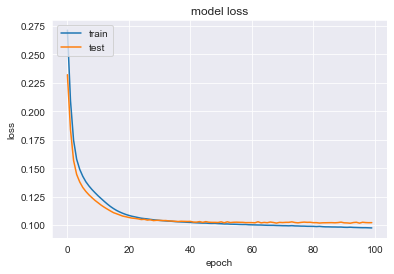

In [119]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

[[0.]
 [1.]
 [0.]
 ...
 [1.]
 [0.]
 [0.]]
7878    1
3224    1
1919    1
4432    0
4835    0
       ..
9073    1
8584    0
5390    1
5092    1
2964    0
Name: Exited, Length: 2000, dtype: int64


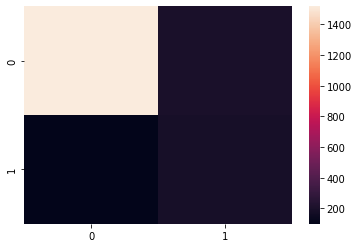

In [26]:
#Get the confusion matrix
cf_matrix = confusion_matrix(predY, testY)
temp = [predY, testY]
heat_map = sb.heatmap(cf_matrix)
print(predY)
print(testY)

plt.show()

## Mean squared error
    
    The first positive result AND the first improvement since the benchmark; Loss reached lows of 0.1 and accuracy highs of up to 0.875.

### Next step

    A loss function not yet tried in class, the binary cross entropy function, shall be tested. 


In [121]:
# Initialising the changed_model
classifier = Sequential()

# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 32, activation='relu',input_dim = 11))

# Adding the second hidden layer
classifier.add(Dense(units = 16, activation='relu'))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid'))

# Compiling the changed_model
classifier.compile(loss = 'binary_crossentropy', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 5ms/step - loss: 0.5903 - accuracy: 0.6925 - val_loss: 0.4719 - val_accuracy: 0.8070
Epoch 2/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4614 - accuracy: 0.7893 - val_loss: 0.4263 - val_accuracy: 0.8175
Epoch 3/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4328 - accuracy: 0.8013 - val_loss: 0.4066 - val_accuracy: 0.8265
Epoch 4/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4152 - accuracy: 0.8193 - val_loss: 0.3940 - val_accuracy: 0.8400
Epoch 5/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4014 - accuracy: 0.8302 - val_loss: 0.3818 - val_accuracy: 0.8450
Epoch 6/100
47/47 [==============================] - 0s 2ms/step - loss: 0.3895 - accuracy: 0.8373 - val_loss: 0.3724 - val_accuracy: 0.8535
Epoch 7/100
47/47 [==============================] - 0s 2ms/step - loss: 0.3786 - accuracy: 0.8423 - val_loss: 0.3653 - val_accuracy: 0.8555
Epoch 8/100
4

In [122]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

200/200 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8480
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      1617
           1       0.64      0.48      0.55       383

    accuracy                           0.85      2000
   macro avg       0.76      0.71      0.73      2000
weighted avg       0.84      0.85      0.84      2000



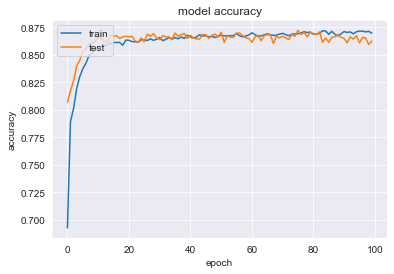

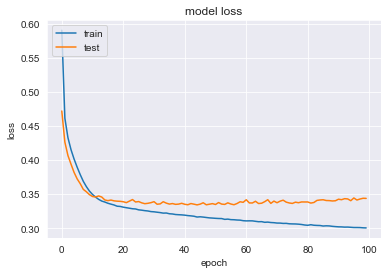

In [123]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Binary Cross Entropy

    The cross entropy function perfomed well and did what it was supposed to. Loss is down to less than 0.35, and the accuracy reached highs up to 87.50%. 

### Next step

    While binary cross entropy perfomed well, Mean Squared Error performed well, and will be used for the further model.


In [114]:
# Initialising the changed_model
classifier = Sequential()
opt = keras.optimizers.Adam(learning_rate = 0.0005)
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 32, activation='relu',input_dim = 11))

# Adding the second hidden layer
classifier.add(Dense(units = 16, activation='relu'))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid'))

# Compiling the changed_model
classifier.compile(optimizer = opt, loss = 'binary_crossentropy', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 5ms/step - loss: 0.6686 - accuracy: 0.5820 - val_loss: 0.5935 - val_accuracy: 0.7410
Epoch 2/100
47/47 [==============================] - 0s 3ms/step - loss: 0.5657 - accuracy: 0.7628 - val_loss: 0.5141 - val_accuracy: 0.8045
Epoch 3/100
47/47 [==============================] - 0s 2ms/step - loss: 0.5110 - accuracy: 0.7868 - val_loss: 0.4700 - val_accuracy: 0.8100
Epoch 4/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4773 - accuracy: 0.7888 - val_loss: 0.4427 - val_accuracy: 0.8120
Epoch 5/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4555 - accuracy: 0.7920 - val_loss: 0.4279 - val_accuracy: 0.8175
Epoch 6/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4412 - accuracy: 0.7987 - val_loss: 0.4182 - val_accuracy: 0.8220
Epoch 7/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4314 - accuracy: 0.8040 - val_loss: 0.4126 - val_accuracy: 0.8245
Epoch 8/100
4

In [115]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

200/200 [==============================] - 0s 1ms/step - loss: 0.3504 - accuracy: 0.8485
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      1617
           1       0.65      0.46      0.54       383

    accuracy                           0.85      2000
   macro avg       0.76      0.70      0.72      2000
weighted avg       0.84      0.85      0.84      2000



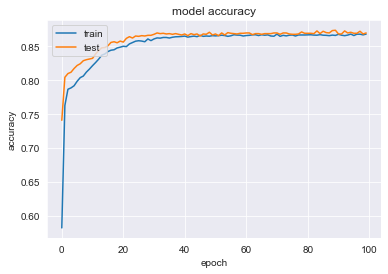

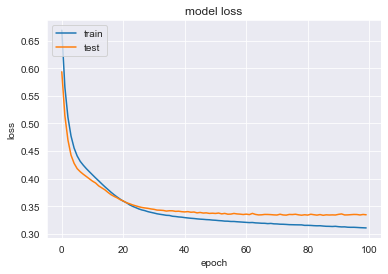

In [116]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Lower learning rate

    Providing a lower learning rate slightly decreased the performance of the model, as the training accuracy and loss performed better. 

### Next Step

    Having a smaller learning rate might have resulted in the model 'falling' into a local minima. The learning rate will now be increased; if the model keeps worsening, then it shall be kept the same and only the Adam classifier will be added.

In [124]:
# Initialising the changed_model
classifier = Sequential()
opt = keras.optimizers.Adam(learning_rate = 0.001)
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 32, activation='relu',input_dim = 11))

# Adding the second hidden layer
classifier.add(Dense(units = 16, activation='relu'))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid'))

# Compiling the changed_model
classifier.compile(optimizer = opt, loss = 'mean_squared_error', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 4ms/step - loss: 0.1830 - accuracy: 0.7785 - val_loss: 0.1537 - val_accuracy: 0.8090
Epoch 2/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1548 - accuracy: 0.7880 - val_loss: 0.1414 - val_accuracy: 0.8100
Epoch 3/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1446 - accuracy: 0.7937 - val_loss: 0.1351 - val_accuracy: 0.8195
Epoch 4/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1371 - accuracy: 0.8070 - val_loss: 0.1296 - val_accuracy: 0.8245
Epoch 5/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1302 - accuracy: 0.8183 - val_loss: 0.1244 - val_accuracy: 0.8375
Epoch 6/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1239 - accuracy: 0.8320 - val_loss: 0.1200 - val_accuracy: 0.8440
Epoch 7/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1184 - accuracy: 0.8453 - val_loss: 0.1149 - val_accuracy: 0.8505
Epoch 8/100
4

In [125]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

200/200 [==============================] - 0s 1ms/step - loss: 0.1109 - accuracy: 0.8420
              precision    recall  f1-score   support

           0       0.88      0.93      0.90      1617
           1       0.61      0.47      0.53       383

    accuracy                           0.84      2000
   macro avg       0.75      0.70      0.72      2000
weighted avg       0.83      0.84      0.83      2000



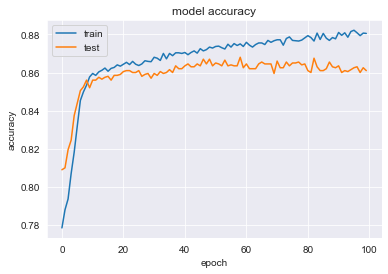

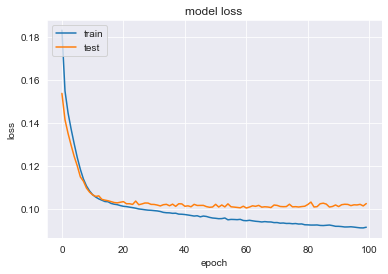

In [126]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Higher learning rate 

    This approach resulted in almost the same results as the previous one. The recall score gained 2%. The learning rate will be kept as is with only the base optimizer. 
### Next step

    The next step includes another layer of 32 neurons and increasing the first layer to 64. This might result into overfitting. 


In [74]:
# Initialising the changed_model
classifier = Sequential()
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 64, activation='relu',input_dim = 11))

classifier.add(Dense(units = 32, activation = 'relu'))

# Adding the second hidden layer
classifier.add(Dense(units = 16, activation='relu'))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid'))

# Compiling the changed_model
classifier.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 5ms/step - loss: 0.5849 - accuracy: 0.7328 - val_loss: 0.4675 - val_accuracy: 0.8090
Epoch 2/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4533 - accuracy: 0.8058 - val_loss: 0.4140 - val_accuracy: 0.8315
Epoch 3/100
47/47 [==============================] - 0s 2ms/step - loss: 0.4167 - accuracy: 0.8230 - val_loss: 0.3912 - val_accuracy: 0.8400
Epoch 4/100
47/47 [==============================] - 0s 2ms/step - loss: 0.3946 - accuracy: 0.8358 - val_loss: 0.3745 - val_accuracy: 0.8540
Epoch 5/100
47/47 [==============================] - 0s 2ms/step - loss: 0.3726 - accuracy: 0.8468 - val_loss: 0.3560 - val_accuracy: 0.8605
Epoch 6/100
47/47 [==============================] - 0s 2ms/step - loss: 0.3526 - accuracy: 0.8578 - val_loss: 0.3470 - val_accuracy: 0.8655
Epoch 7/100
47/47 [==============================] - 0s 2ms/step - loss: 0.3408 - accuracy: 0.8593 - val_loss: 0.3401 - val_accuracy: 0.8655
Epoch 8/100
4

In [75]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

200/200 [==============================] - 0s 1ms/step - loss: 0.4771 - accuracy: 0.8255
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      1617
           1       0.55      0.50      0.53       383

    accuracy                           0.83      2000
   macro avg       0.72      0.70      0.71      2000
weighted avg       0.82      0.83      0.82      2000



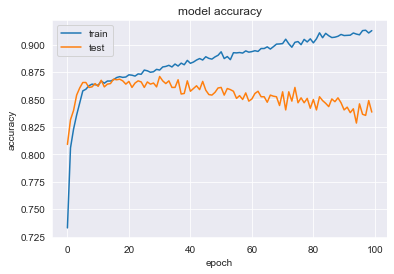

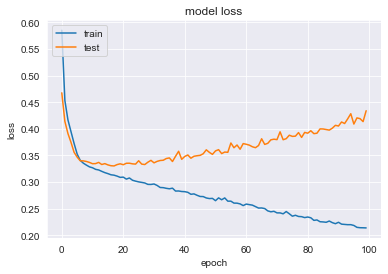

In [76]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## More layers

    The result is evident: overfitting. Nevertheless, the model began with amazing starting test accuracy. It will be kept, and it will be improved upon.

### Next step

    Regularization has been proven to be one of the first procedures to implement when overfitting happens.  Different tests will be run, where both l1 and l2 will be changed, and the best one will be kept and displayed.

In [127]:
# Initialising the changed_model
classifier = Sequential()
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 64, activation='relu',input_dim = 11))

classifier.add(Dense(units = 32, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))

# Adding the second hidden layer
classifier.add(Dense(units = 16, activation='relu',kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid',kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))

# Compiling the changed_model
classifier.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 6ms/step - loss: 0.1739 - accuracy: 0.7863 - val_loss: 0.1386 - val_accuracy: 0.8105
Epoch 2/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1411 - accuracy: 0.8038 - val_loss: 0.1264 - val_accuracy: 0.8320
Epoch 3/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1303 - accuracy: 0.8245 - val_loss: 0.1188 - val_accuracy: 0.8430
Epoch 4/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1208 - accuracy: 0.8405 - val_loss: 0.1116 - val_accuracy: 0.8560
Epoch 5/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1132 - accuracy: 0.8528 - val_loss: 0.1052 - val_accuracy: 0.8650
Epoch 6/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1078 - accuracy: 0.8578 - val_loss: 0.1046 - val_accuracy: 0.8615
Epoch 7/100
47/47 [==============================] - 0s 2ms/step - loss: 0.1048 - accuracy: 0.8613 - val_loss: 0.1022 - val_accuracy: 0.8640
Epoch 8/100
4

In [128]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

200/200 [==============================] - 0s 1ms/step - loss: 0.1331 - accuracy: 0.8290
              precision    recall  f1-score   support

           0       0.88      0.91      0.90      1617
           1       0.56      0.47      0.51       383

    accuracy                           0.83      2000
   macro avg       0.72      0.69      0.70      2000
weighted avg       0.82      0.83      0.82      2000



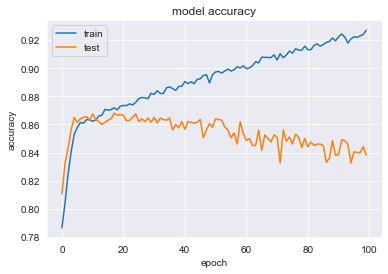

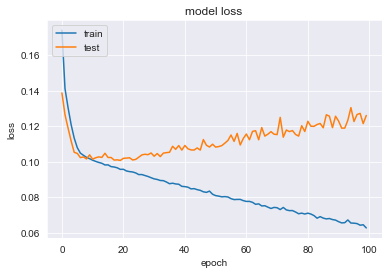

In [129]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## L1 and L2 

    This is the best combination provided L1 and L2, along with bias regulizers. The starting point IS better and the testing accuracy reaches new heights, although it suddently drops afterwards. This is syncronized with a stagnation of a sharp increase of the testing loss. Overfitting is still prevalent, but this model can get better. 
###  Next step

    Dropout to each layer will be implemented.
    

In [130]:
# Initialising the changed_model
classifier = Sequential()
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 64, activation='relu',input_dim = 11))
classifier.add(Dropout(0.02))

classifier.add(Dense(units = 32, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))
classifier.add(Dropout(0.02))

# Adding the second hidden layer
classifier.add(Dense(units = 16, activation='relu',kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))
classifier.add(Dropout(0.02))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid',kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))
classifier.add(Dropout(0.02))

# Compiling the changed_model
classifier.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 6ms/step - loss: 0.1978 - accuracy: 0.7110 - val_loss: 0.1454 - val_accuracy: 0.8090
Epoch 2/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1474 - accuracy: 0.7977 - val_loss: 0.1306 - val_accuracy: 0.8270
Epoch 3/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1385 - accuracy: 0.8107 - val_loss: 0.1254 - val_accuracy: 0.8295
Epoch 4/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1298 - accuracy: 0.8238 - val_loss: 0.1188 - val_accuracy: 0.8390
Epoch 5/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1213 - accuracy: 0.8418 - val_loss: 0.1104 - val_accuracy: 0.8555
Epoch 6/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1155 - accuracy: 0.8483 - val_loss: 0.1070 - val_accuracy: 0.8595
Epoch 7/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1129 - accuracy: 0.8482 - val_loss: 0.1063 - val_accuracy: 0.8625
Epoch 8/100
4

In [131]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

200/200 [==============================] - 0s 1ms/step - loss: 0.1180 - accuracy: 0.8505
              precision    recall  f1-score   support

           0       0.87      0.95      0.91      1617
           1       0.68      0.42      0.52       383

    accuracy                           0.85      2000
   macro avg       0.78      0.69      0.71      2000
weighted avg       0.84      0.85      0.84      2000



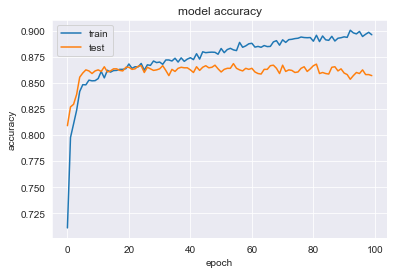

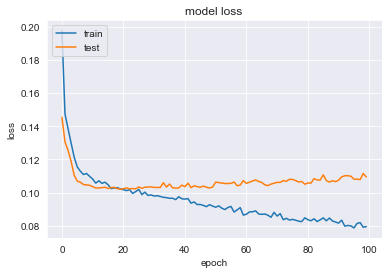

In [132]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Dropout

    Results similar to L1 and L2, although it achieved what was expected: the loss, instead of increasing is now stagnating. The accuracy peaks at over 86%, so there's a little way to go before 90%.

### Next Step

    Kernel initializers will be brought in to initialize the weights of the network, and hopefully decrease the overfitting. The initializers used will be:
    
* Glorot Uniform
* Glorot Normal
* He Uniform
* He Normal 
* Random Uniform
* Random Normal

    The best result will be displayed.


In [133]:
# Initialising the changed_model
classifier = Sequential()
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 64, activation='relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), kernel_initializer = 'he_uniform', input_dim = 11))
classifier.add(Dropout(0.02))

classifier.add(Dense(units = 32, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0), kernel_initializer = 'he_uniform'))
classifier.add(Dropout(0.02))

# Adding the second hidden layer
classifier.add(Dropout(0.02))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid',kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005), kernel_initializer = 'he_uniform', bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))
classifier.add(Dropout(0.02))

# Compiling the changed_model
classifier.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 6ms/step - loss: 0.1880 - accuracy: 0.7303 - val_loss: 0.1421 - val_accuracy: 0.8150
Epoch 2/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1482 - accuracy: 0.8023 - val_loss: 0.1328 - val_accuracy: 0.8285
Epoch 3/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1406 - accuracy: 0.8118 - val_loss: 0.1284 - val_accuracy: 0.8285
Epoch 4/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1375 - accuracy: 0.8163 - val_loss: 0.1246 - val_accuracy: 0.8335
Epoch 5/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1304 - accuracy: 0.8305 - val_loss: 0.1200 - val_accuracy: 0.8445
Epoch 6/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1252 - accuracy: 0.8357 - val_loss: 0.1153 - val_accuracy: 0.8510
Epoch 7/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1204 - accuracy: 0.8437 - val_loss: 0.1123 - val_accuracy: 0.8575
Epoch 8/100
4

200/200 [==============================] - 0s 1ms/step - loss: 0.1168 - accuracy: 0.8405
              precision    recall  f1-score   support

           0       0.88      0.93      0.90      1617
           1       0.61      0.45      0.52       383

    accuracy                           0.84      2000
   macro avg       0.75      0.69      0.71      2000
weighted avg       0.83      0.84      0.83      2000



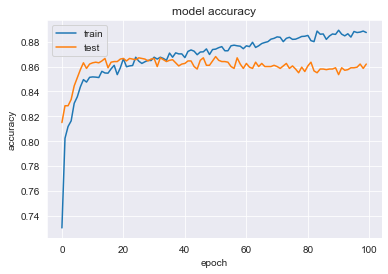

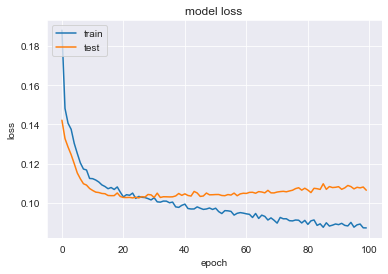

In [134]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


200/200 [==============================] - 0s 1ms/step - loss: 0.3693 - accuracy: 0.8380
              precision    recall  f1-score   support

           0       0.88      0.92      0.90      1617
           1       0.59      0.48      0.53       383

    accuracy                           0.84      2000
   macro avg       0.74      0.70      0.72      2000
weighted avg       0.83      0.84      0.83      2000



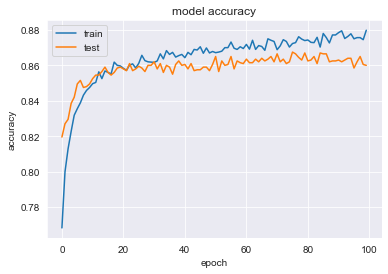

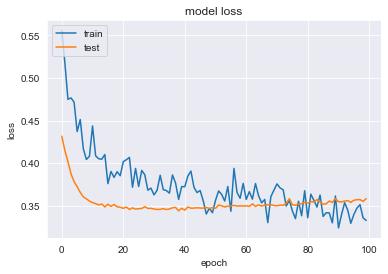

In [85]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


## Random Initializer

    Results are positive, accuracy is still going up and the loss is continuing the descent over 0.35. 

## Next step

    Now that these are the best hyperparameters as of far, the activation function will be changed. The change will happen between different permutations of ReLU, sigmoid and tanh. The best one will be displayed. 

In [143]:
# Initialising the changed_model
classifier = Sequential()
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 64, activation='relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), kernel_initializer = 'he_uniform', input_dim = 11))
classifier.add(Dropout(0.02))

classifier.add(Dense(units = 32, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0), kernel_initializer = 'he_uniform'))
classifier.add(Dropout(0.02))

# Adding the second hidden layer
classifier.add(Dropout(0.02))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid',kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005), kernel_initializer = 'he_uniform', bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))
classifier.add(Dropout(0.02))

# Compiling the changed_model
classifier.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 6ms/step - loss: 0.2178 - accuracy: 0.7082 - val_loss: 0.1520 - val_accuracy: 0.8075
Epoch 2/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1552 - accuracy: 0.7967 - val_loss: 0.1361 - val_accuracy: 0.8240
Epoch 3/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1437 - accuracy: 0.8078 - val_loss: 0.1288 - val_accuracy: 0.8360
Epoch 4/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1372 - accuracy: 0.8193 - val_loss: 0.1249 - val_accuracy: 0.8415
Epoch 5/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1325 - accuracy: 0.8262 - val_loss: 0.1221 - val_accuracy: 0.8440
Epoch 6/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1284 - accuracy: 0.8313 - val_loss: 0.1187 - val_accuracy: 0.8450
Epoch 7/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1251 - accuracy: 0.8327 - val_loss: 0.1170 - val_accuracy: 0.8480
Epoch 8/100
4

200/200 [==============================] - 0s 1ms/step - loss: 0.1209 - accuracy: 0.8415
              precision    recall  f1-score   support

           0       0.89      0.92      0.90      1617
           1       0.60      0.51      0.55       383

    accuracy                           0.84      2000
   macro avg       0.74      0.72      0.73      2000
weighted avg       0.83      0.84      0.84      2000



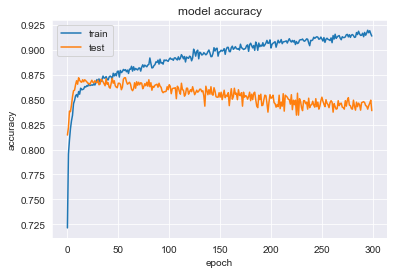

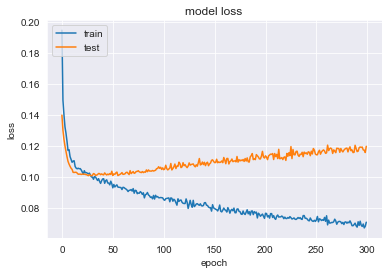

In [142]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


In [147]:
opt = keras.optimizers.Adam(learning_rate = 0.0006)
# Initialising the changed_model
classifier = Sequential()
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 64, activation='relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), kernel_initializer = 'he_uniform', input_dim = 11))
classifier.add(Dropout(0.02))

classifier.add(Dense(units = 32, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0), kernel_initializer = 'he_uniform'))
classifier.add(Dropout(0.02))

# Adding the second hidden layer
classifier.add(Dropout(0.02))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid',kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005), kernel_initializer = 'he_uniform', bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))
classifier.add(Dropout(0.02))

# Compiling the changed_model
classifier.compile(optimizer = opt, loss = 'mean_squared_error', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 7ms/step - loss: 0.1969 - accuracy: 0.7138 - val_loss: 0.1518 - val_accuracy: 0.7995
Epoch 2/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1561 - accuracy: 0.7897 - val_loss: 0.1401 - val_accuracy: 0.8165
Epoch 3/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1459 - accuracy: 0.8063 - val_loss: 0.1322 - val_accuracy: 0.8265
Epoch 4/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1407 - accuracy: 0.8115 - val_loss: 0.1282 - val_accuracy: 0.8315
Epoch 5/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1353 - accuracy: 0.8203 - val_loss: 0.1233 - val_accuracy: 0.8390
Epoch 6/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1310 - accuracy: 0.8217 - val_loss: 0.1203 - val_accuracy: 0.8460
Epoch 7/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1284 - accuracy: 0.8283 - val_loss: 0.1169 - val_accuracy: 0.8510
Epoch 8/100
4

200/200 [==============================] - 0s 1ms/step - loss: 0.1094 - accuracy: 0.8525
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      1617
           1       0.67      0.46      0.55       383

    accuracy                           0.85      2000
   macro avg       0.77      0.70      0.73      2000
weighted avg       0.84      0.85      0.84      2000



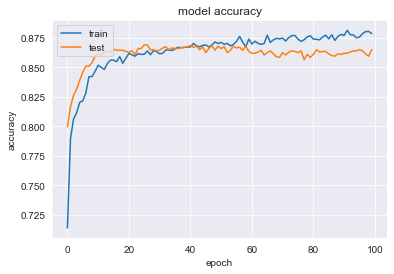

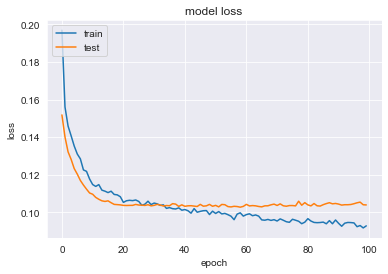

In [148]:
predY = classifier.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


## Model builder

    So far, the Neural Networks has been built through logical assestment of the varying situations; the different hyperparameters have been changed based on the evolution of the accuracy and the loss. Automating this process could prove helpful, and Keras luckily has a library to do just that. The following snippet of code displays a function that, when run, displays the values of various hyperparameters that result in optimal performances right away. The included hyperparameters are the number of layers, the number of neurons per layer and the dropout rate after each one.

    A model is then constructed using the predicted hyperparameters and the results are displayed and graphed. 

In [88]:
from tensorflow.keras import layers
import keras_tuner as kt
from keras_tuner.tuners import RandomSearch
def model_Builder(hp):
    model = keras.Sequential()
    counter = 0
    for i in range(hp.Int('num_layers',min_value=1,max_value=10)):
        if counter == 0:
            model.add(layers.Dense(hp.Int('units_' + str(i),
                                min_value=8,
                                max_value=128,
                                step=8), kernel_initializer = 'he_uniform', activation='relu',input_dim = 11))
            model.add(Dropout(hp.Choice('dropout' + str(i), values=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9])))
        else:
            model.add(layers.Dense(units=hp.Int('units_' + str(i),
                                            min_value=8,
                                            max_value=128,
                                            step=8),
                               activation='relu', kernel_initializer = 'he_uniform'))
            model.add(Dropout(hp.Choice('dropout' + str(i), values=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9])))
        counter+=1
    
    model.add(layers.Dense(1, activation='sigmoid', kernel_initializer = 'glorot_uniform'))
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='binary_crossentropy',
        metrics=['accuracy'])
    return model        

In [89]:
kerasTuner = RandomSearch(
    model_Builder,
    objective='val_accuracy',
    seed=42,
    max_trials=5,
    executions_per_trial=3,
    directory='project4',
    project_name='Churn modelling4')

INFO:tensorflow:Reloading Oracle from existing project project4\Churn modelling4\oracle.json
INFO:tensorflow:Reloading Tuner from project4\Churn modelling4\tuner0.json


In [90]:
kerasTuner.search(trainX, trainY, epochs=5, batch_size=128, 
             validation_data=(valX, valY))

INFO:tensorflow:Oracle triggered exit


In [91]:
kerasTuner.get_best_hyperparameters()[0].values

{'num_layers': 2,
 'units_0': 64,
 'dropout0': 0.5,
 'learning_rate': 0.01,
 'units_1': 104,
 'dropout1': 0.3,
 'units_2': 56,
 'dropout2': 0.2,
 'units_3': 32,
 'dropout3': 0.2,
 'units_4': 56,
 'dropout4': 0.8,
 'units_5': 72,
 'dropout5': 0.9,
 'units_6': 56,
 'dropout6': 0.4,
 'units_7': 48,
 'dropout7': 0.7,
 'units_8': 24,
 'dropout8': 0.4}

* The model is now constructed using the hyperparameters predicted above.

In [92]:
model = kerasTuner.get_best_models(num_models=1)[0]
model_history = model.fit(trainX, trainY, epochs=200, initial_epoch=6, validation_data=(valX,valY))

Epoch 7/200
188/188 [==============================] - 1s 3ms/step - loss: 0.4082 - accuracy: 0.8273 - val_loss: 0.3602 - val_accuracy: 0.8615
Epoch 8/200
188/188 [==============================] - 0s 2ms/step - loss: 0.3957 - accuracy: 0.8297 - val_loss: 0.3608 - val_accuracy: 0.8595
Epoch 9/200
188/188 [==============================] - 0s 2ms/step - loss: 0.3888 - accuracy: 0.8358 - val_loss: 0.3450 - val_accuracy: 0.8620
Epoch 10/200
188/188 [==============================] - 0s 2ms/step - loss: 0.3810 - accuracy: 0.8413 - val_loss: 0.3477 - val_accuracy: 0.8610
Epoch 11/200
188/188 [==============================] - 0s 2ms/step - loss: 0.3793 - accuracy: 0.8390 - val_loss: 0.3518 - val_accuracy: 0.8635
Epoch 12/200
188/188 [==============================] - 0s 2ms/step - loss: 0.3743 - accuracy: 0.8462 - val_loss: 0.3511 - val_accuracy: 0.8605
Epoch 13/200
188/188 [==============================] - 0s 2ms/step - loss: 0.3740 - accuracy: 0.8395 - val_loss: 0.3581 - val_accuracy: 0.

200/200 [==============================] - 0s 1ms/step - loss: 0.5319 - accuracy: 0.8330
              precision    recall  f1-score   support

           0       0.86      0.99      0.92      1617
           1       0.85      0.30      0.45       383

    accuracy                           0.86      2000
   macro avg       0.85      0.65      0.68      2000
weighted avg       0.86      0.86      0.83      2000



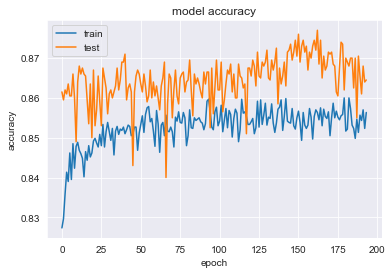

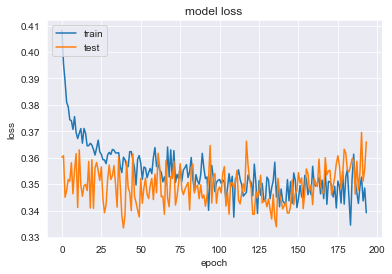

In [93]:
predY = model.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


## Model builder - Results

    While the slope of both the loss AND the accuracy is quite flat, this model provved successful right from the first epoch. The accuracy peaks at 87.70% and finds its lowest point at 84%, while the loss never rises above 0.36. While not perfect, the function that was built did provide a good model that could have been used akin to the others. 

## Extra layers

    A model with more layers than before (7) will be tried, following the recommendations from the model builder. The number of neurons AND dropout value will be used as well, along with the previously used regularization and initialization. 

In [139]:
# Initialising the changed_model
classifier = Sequential()
# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 64, activation='relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), kernel_initializer = 'he_uniform', input_dim = 11))
classifier.add(Dropout(0.02))

classifier.add(Dense(units = 32, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0), kernel_initializer = 'he_uniform'))
classifier.add(Dropout(0.02))

# Adding the second hidden layer
classifier.add(Dense(units = 16, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0), kernel_initializer = 'he_uniform'))
classifier.add(Dropout(0.02))

classifier.add(Dense(units = 8, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0), kernel_initializer = 'he_uniform'))
classifier.add(Dropout(0.02))

classifier.add(Dense(units = 4, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0), kernel_initializer = 'he_uniform'))
classifier.add(Dropout(0.02))

classifier.add(Dense(units = 2, activation = 'relu', kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005 ), bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0), kernel_initializer = 'he_uniform'))
classifier.add(Dropout(0.02))

# Adding the output layer
classifier.add(Dense(units = 1,  activation = 'sigmoid',kernel_regularizer = l1_l2(l1 = 0.00000001, l2 = 0.000000000005), kernel_initializer = 'he_uniform', bias_regularizer = l1_l2(l1 = 0.00000001, l2 = 0)))
classifier.add(Dropout(0.02))

# Compiling the changed_model
classifier.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['accuracy'])

# Fitting the changed_model to the Training set
model_history=classifier.fit(trainX, trainY,validation_data=(valX, valY), batch_size = 128, epochs = 100)

Epoch 1/100
47/47 [==============================] - 1s 10ms/step - loss: 0.2433 - accuracy: 0.3900 - val_loss: 0.1978 - val_accuracy: 0.8090
Epoch 2/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1804 - accuracy: 0.7880 - val_loss: 0.1483 - val_accuracy: 0.8090
Epoch 3/100
47/47 [==============================] - 0s 4ms/step - loss: 0.1576 - accuracy: 0.7880 - val_loss: 0.1311 - val_accuracy: 0.8090
Epoch 4/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1427 - accuracy: 0.7880 - val_loss: 0.1241 - val_accuracy: 0.8090
Epoch 5/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1390 - accuracy: 0.7880 - val_loss: 0.1221 - val_accuracy: 0.8090
Epoch 6/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1331 - accuracy: 0.7880 - val_loss: 0.1179 - val_accuracy: 0.8090
Epoch 7/100
47/47 [==============================] - 0s 3ms/step - loss: 0.1309 - accuracy: 0.7880 - val_loss: 0.1183 - val_accuracy: 0.8090
Epoch 8/100


200/200 [==============================] - 0s 1ms/step - loss: 0.1212 - accuracy: 0.8355
              precision    recall  f1-score   support

           0       0.86      0.99      0.92      1617
           1       0.85      0.30      0.45       383

    accuracy                           0.86      2000
   macro avg       0.85      0.65      0.68      2000
weighted avg       0.86      0.86      0.83      2000



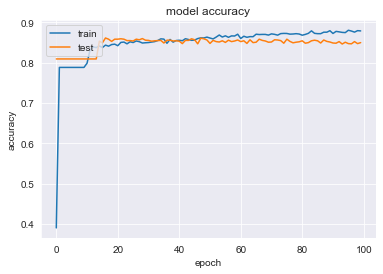

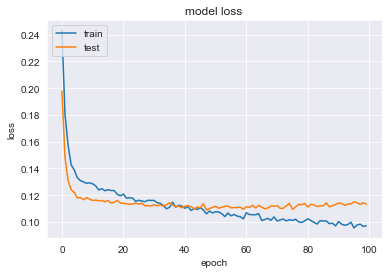

In [140]:
predY = model.predict(testX)
predY = np.round_(predY)
classifier.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


## Extra layers - Results

    This has been the best architecture yet. Combining the two architectures, the accuracy obtained is slightly above 87.5% at its peak, although the Loss is stunning: less than 0.12; almost a third of what is was before. 

### Next Step

    Tanh, sigmoid and softmax functions have been tested in different combinations. Having the majority of ReLUs and a final sigmoid, a new architecture must be tried


## All sigmoids

    Lastly, a Neural Network composed of all sigmoid activation functions is tried, and the results are viewed. Softmax and tanh have been proven unsuccesful in earlier attempts. 

In [33]:
changed_model = tf.keras.models.Sequential()
changed_model.add(tf.keras.layers.Dense(units=15, activation='sigmoid'))
changed_model.add(tf.keras.layers.Dense(units=25, activation='sigmoid'))
changed_model.add(tf.keras.layers.Dense(units=15, activation='sigmoid'))
changed_model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))
changed_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model_history = changed_model.fit(trainX, trainY, verbose=1, batch_size=64, epochs=100, validation_data=(testX, testY))
changed_model.summary()

Epoch 1/100
94/94 [==============================] - 1s 4ms/step - loss: 0.6540 - accuracy: 0.6032 - val_loss: 0.5060 - val_accuracy: 0.8085
Epoch 2/100
94/94 [==============================] - 0s 2ms/step - loss: 0.5162 - accuracy: 0.7880 - val_loss: 0.4864 - val_accuracy: 0.8085
Epoch 3/100
94/94 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.7880 - val_loss: 0.4824 - val_accuracy: 0.8085
Epoch 4/100
94/94 [==============================] - 0s 2ms/step - loss: 0.5055 - accuracy: 0.7880 - val_loss: 0.4767 - val_accuracy: 0.8085
Epoch 5/100
94/94 [==============================] - 0s 2ms/step - loss: 0.4970 - accuracy: 0.7880 - val_loss: 0.4677 - val_accuracy: 0.8085
Epoch 6/100
94/94 [==============================] - 0s 2ms/step - loss: 0.4835 - accuracy: 0.7880 - val_loss: 0.4535 - val_accuracy: 0.8085
Epoch 7/100
94/94 [==============================] - 0s 2ms/step - loss: 0.4654 - accuracy: 0.7880 - val_loss: 0.4390 - val_accuracy: 0.8085
Epoch 8/100
9

200/200 [==============================] - 0s 1ms/step - loss: 0.3493 - accuracy: 0.8615
              precision    recall  f1-score   support

           0       0.88      0.96      0.92      1617
           1       0.73      0.44      0.55       383

    accuracy                           0.86      2000
   macro avg       0.81      0.70      0.73      2000
weighted avg       0.85      0.86      0.85      2000



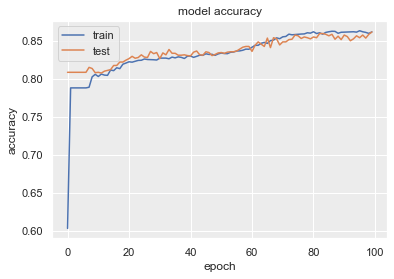

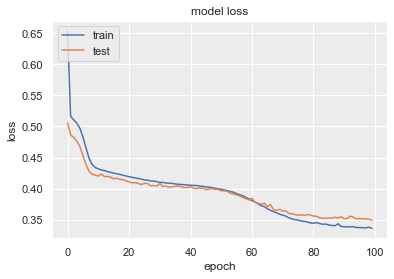

In [37]:
predY = changed_model.predict(testX)
predY = np.round_(predY)
changed_model.evaluate(testX, testY,batch_size=10)
print(classification_report(testY,predY))

# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot( model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


## All sigmoids - Result

    The sigmoid did a good job, with a steadily increasing accuracy and a steadily decreasing loss. The accuracy peaks just above 85%, and the loss declines to 0.35. Average results

# Conclusion

    As the results set in, it can be observed that the Feed Forward Neural Networks beat the Machine Learning algorithms by about 2%. The models all peak at 87.5%, whether with regularization or without, along with other hyperparameters and number of layers. 

    The reason for there being a cap on the accuracy could be because of the imbalanced dataset, along with the 'Balance' feature. The Balance presents too many 0 values, which significantly skew it, as seen by the distribution plot provided earlier. 

    The best model was the one the model builder generated, along with kernel initialization and regulization. It was incredibly interesting to have a final result as this. Just the model builder on its own was very interesting to code and to build, and to add to it and actually get a better result was even more intriguing.  

### Improvements to be made

    If I could continue the project, I would find a way to install imblearn and balance the 'Exited' class and I would like to explore how the models react to the same dataset, without the '0' values for the 'Balance' feature. 

    I would also enjoy exploring different possibilities with regularization: it can make or break the model, it can save a model from overfitting, or completely render it slave to it. 
